# Análise de Dados imobiliários com o DataSet Boston
Veremos o primeiro processo da análise exploratória

### Base de dados:
DataSet Boston da biblioteca sklearn


In [2]:
#Bibliotecas
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.datasets import load_boston
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
import os

In [3]:
# import o ProfileReport
from pandas_profiling import ProfileReport

In [4]:
#Definindo diretórios 
BASE_DIR = os.getcwd()
DATA_DIR = os.path.join(BASE_DIR, 'data')
ANALISE_DIR = os.path.join(BASE_DIR, 'analise')

In [1]:
conda info --envs

# conda environments:
#
base                     C:\Users\rebec\anaconda3
programaria-env       *  C:\Users\rebec\anaconda3\envs\programaria-env


Note: you may need to restart the kernel to use updated packages.


In [5]:
#Carrega DataSet
boston = load_boston()

In [6]:
#Descrição do Dataset
boston.DESCR

".. _boston_dataset:\n\nBoston house prices dataset\n---------------------------\n\n**Data Set Characteristics:**  \n\n    :Number of Instances: 506 \n\n    :Number of Attributes: 13 numeric/categorical predictive. Median Value (attribute 14) is usually the target.\n\n    :Attribute Information (in order):\n        - CRIM     per capita crime rate by town\n        - ZN       proportion of residential land zoned for lots over 25,000 sq.ft.\n        - INDUS    proportion of non-retail business acres per town\n        - CHAS     Charles River dummy variable (= 1 if tract bounds river; 0 otherwise)\n        - NOX      nitric oxides concentration (parts per 10 million)\n        - RM       average number of rooms per dwelling\n        - AGE      proportion of owner-occupied units built prior to 1940\n        - DIS      weighted distances to five Boston employment centres\n        - RAD      index of accessibility to radial highways\n        - TAX      full-value property-tax rate per $10,000

In [7]:
#Cria Df
df = pd.DataFrame(boston.data, columns=boston.feature_names)

In [8]:
df.head()

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT
0,0.00632,18.0,2.31,0.0,0.538,6.575,65.2,4.0900,1.0,296.0,15.3,396.90,4.98
1,0.02731,0.0,7.07,0.0,0.469,6.421,78.9,4.9671,2.0,242.0,17.8,396.90,9.14
2,0.02729,0.0,7.07,0.0,0.469,7.185,61.1,4.9671,2.0,242.0,17.8,392.83,4.03
3,0.03237,0.0,2.18,0.0,0.458,6.998,45.8,6.0622,3.0,222.0,18.7,394.63,2.94
4,0.06905,0.0,2.18,0.0,0.458,7.147,54.2,6.0622,3.0,222.0,18.7,396.90,5.33


### Dicionario de dados
**`CRIM`**: Taxa de criminalidade per capita por regiao.

**`ZN`**: Proporção de terrenos residenciais divididos por lotes com mais de 25.000 pés quadrados.

**`INDUS`**: Essa é a proporção de hectares de negócios não comerciais por regiao.

**`CHAS`**: variável fictícia Charles River (= 1 se o trecho limita o rio; 0 caso contrário)

**`NOX`**: concentração de óxido nítrico (partes por 10 milhões)

**`RM`**: Número médio de quartos entre as casas do bairro

**`Age`**: proporção de unidades ocupadas pelos proprietários construídas antes de 1940

**`DIS`**: distâncias ponderadas para cinco centros de emprego em Boston

**`RAD`**: Índice de acessibilidade às rodovias radiais

**`IMPOSTO`**: taxa do imposto sobre a propriedade de valor total por US $ 10.000

**`B`**: 1000 (Bk - 0,63) ², onde Bk é a proporção de pessoas de descendência afro-americana por regiao

**`PTRATIO`**: Bairros com maior proporção de alunos para professores (maior valor de 'PTRATIO')

**`LSTAT`**: porcentagem de status mais baixo da população

**`MEDV`**: valor médio de casas ocupadas pelos proprietários em US $ 1000

In [9]:
# boston.target é onde estão os meus dados da nova coluna MEDV
df['MEDV'] = boston.target

In [10]:
#Salvando em csv
df.to_csv(os.path.join(DATA_DIR,'boston.csv'))

In [11]:
df.describe()

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,MEDV
count,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000
mean,3.613524,11.363636,11.136779,0.069170,0.554695,6.284634,68.574901,3.795043,9.549407,408.237154,18.455534,356.674032,12.653063,22.532806
std,8.601545,23.322453,6.860353,0.253994,0.115878,0.702617,28.148861,2.105710,8.707259,168.537116,2.164946,91.294864,7.141062,9.197104
min,0.006320,0.000000,0.460000,0.000000,0.385000,3.561000,2.900000,1.129600,1.000000,187.000000,12.600000,0.320000,1.730000,5.000000
25%,0.082045,0.000000,5.190000,0.000000,0.449000,5.885500,45.025000,2.100175,4.000000,279.000000,17.400000,375.377500,6.950000,17.025000
50%,0.256510,0.000000,9.690000,0.000000,0.538000,6.208500,77.500000,3.207450,5.000000,330.000000,19.050000,391.440000,11.360000,21.200000
75%,3.677083,12.500000,18.100000,0.000000,0.624000,6.623500,94.075000,5.188425,24.000000,666.000000,20.200000,396.225000,16.955000,25.000000
max,88.976200,100.000000,27.740000,1.000000,0.871000,8.780000,100.000000,12.126500,24.000000,711.000000,22.000000,396.900000,37.970000,50.000000


### Análise Exploratória dos Dados

In [27]:
# executando o profile
profile = ProfileReport(df, title='Relatório - Pandas Profiling', html={'style':{'full_width':True}})

In [28]:
profile

**Observações**

*   *O coeficiente de correlação varia de `-1` a `1`. 
Se valor é próximo de 1, isto significa que existe uma forte correlação positiva entre as variáveis. Quando esse número é próximo de -1, as variáveis tem uma forte correlação negativa.*

*   *A relatório que executamos acima nos mostra que a nossa variável alvo (**MEDV**) é fortemente correlacionada com as variáveis `LSTAT` e `RM`*

*   *`RAD` e `TAX` são fortemente correlacionadas, podemos remove-las do nosso modelo para evitar a multi-colinearidade.*

*   *O mesmo acontece com as colunas `DIS` and `AGE` a qual tem a correlação de -0.75*

*   *A coluna `ZN` possui 73% de valores zero.*

In [30]:
# salvando o relatório
profile.to_file(output_file = os.path.join(ANALISE_DIR,'Relatorio01.html'))

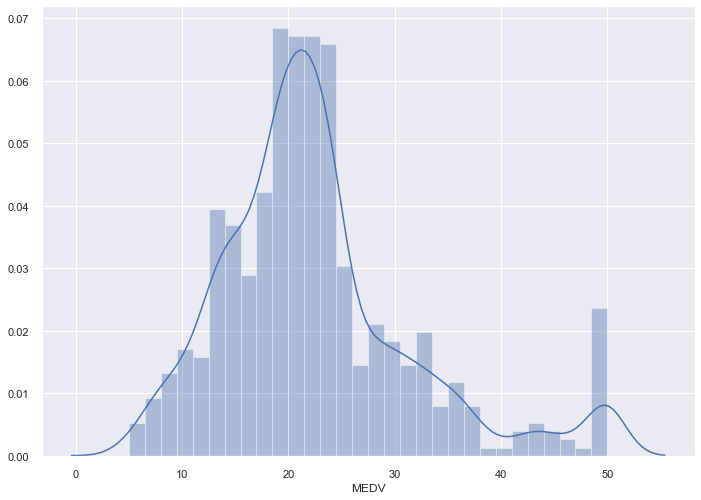

In [12]:
#Plotando a distribuição da váriavel target
sns.set(rc={'figure.figsize':(11.7,8.27)})
sns.distplot(df['MEDV'], bins=30)
plt.show()

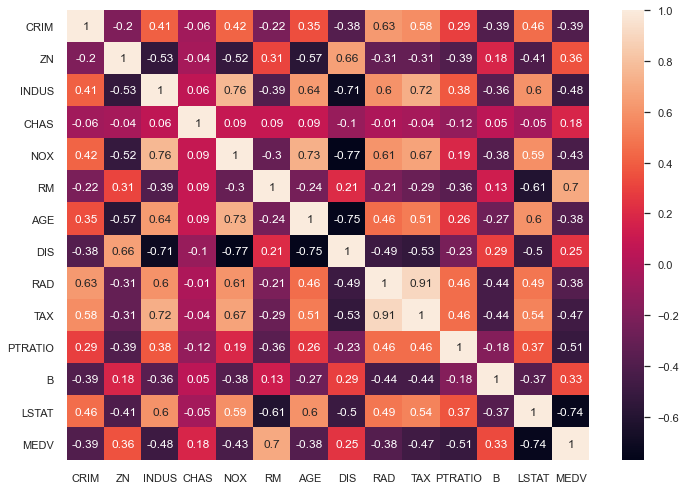

In [14]:
#Matriz para ver correlação das variáveis
correlation_matrix = df.corr().round(2)
# annot = True para imprimir os valores dentro dos quadrados
sns.heatmap(data=correlation_matrix, annot=True)

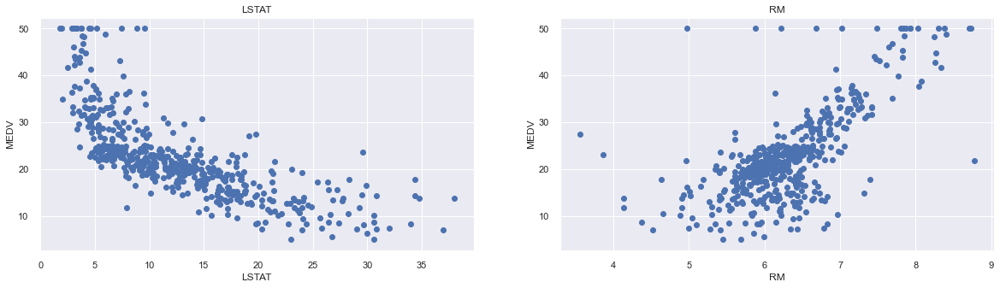

In [15]:
#Para ajustar o modelo de regressão linear, selecionamos as variáveis que têm uma alta correlação com a 
#nossa variável alvo MEDV

#Veremos como elas variam com o target

plt.figure(figsize=(20, 5))

features = ['LSTAT', 'RM']
target = df['MEDV']

for i, col in enumerate(features):
    plt.subplot(1, len(features) , i+1)
    x = df[col]
    y = target
    plt.scatter(x, y, marker='o')
    plt.title(col)
    plt.xlabel(col)
    plt.ylabel('MEDV')

Os preços aumentam à medida que o valor de RM aumenta linearmente. Existem poucos valores discrepantes e os dados parecem estar limitados a 50.
Os preços tendem a diminuir com o aumento do LSTAT. Embora não pareça seguir exatamente uma linha linear

### Preparação do modelo

In [17]:
#Concatenamos as colunas LSTAT e RM
X = pd.DataFrame(np.c_[df['LSTAT'], df['RM']], columns = ['LSTAT','RM'])
Y = df['MEDV']

In [18]:
#Separando treino e teste
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size = 0.2, random_state=5)
print(X_train.shape)
print(X_test.shape)
print(Y_train.shape)
print(Y_test.shape)

(404, 2)
(102, 2)
(404,)
(102,)


### Treinando e testando modelo

In [19]:
lin_model = LinearRegression()
lin_model.fit(X_train, Y_train)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)

In [22]:
# Avaliação do modelo para o set de treino
y_train_predict = lin_model.predict(X_train)
rmse = (np.sqrt(mean_squared_error(Y_train, y_train_predict)))
r2 = r2_score(Y_train, y_train_predict)

print("Performance do modelo para o set de treino foi:")
print("--------------------------------------")
print('RMSE é {}'.format(rmse))
print('R2 score é {}'.format(r2))
print("\n")

# Avaliação do modelo para o set de teste
y_test_predict = lin_model.predict(X_test)
rmse = (np.sqrt(mean_squared_error(Y_test, y_test_predict)))
r2 = r2_score(Y_test, y_test_predict)

print("Performance do modelo para o set de teste foi:")
print("--------------------------------------")
print('RMSE é {}'.format(rmse))
print('R2 score é {}'.format(r2))

Performance do modelo para o set de treino foi:
--------------------------------------
RMSE é 5.6371293350711955
R2 score é 0.6300745149331701


Performance do modelo para o set de teste foi:
--------------------------------------
RMSE é 5.137400784702911
R2 score é 0.6628996975186953
